### Lockdown in GERDA LIGHT

In [1]:
import GERDA_light as gl 
import numpy as np
import logging as log
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from G_utils.p_matrix import contact_lists_from_p_l_t, get_lockdown_plt

plt.style.use('seaborn-v0_8-paper')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [467]:
#plt.style.available

In [2]:
dT=24
w1 = gl.World(
           p_l_t_filepath = 'src/Gangelt_03_new_p_l_t.gz',
           ai_df_filename = 'src/Gangelt_03_new_ai_df.gz',
           clustering=False,
           k_I=0.2,
           only_P1=False,
           dT=dT,
           )


INFO:root:create contact list


INFO:root:contact list is done
INFO:root:max cluster size: 1


In [453]:
dT=24
w2 = gl.World(
           p_l_t_filepath = 'src/Gangelt_01_new_p_l_t.gz',
           ai_df_filename = 'src/Gangelt_01_new_ai_df.gz',
           clustering=False,
           k_I=0.2,
           only_P1=False,
           dT=dT,
           )

INFO:root:create contact list
INFO:root:contact list is done
INFO:root:max cluster size: 1


In [456]:
T1=int(168/dT)
model = gl.SIS_model(w1,sim_id=1) 
for i in range(400,404):  # selected agent ID 
    model.world.agents[i].state=1 ## infect one agent
    model.world.agents[i].times['infection'] = 0 
model.run(timespan=T1, only_inf_rel_contacts=True, only_infection=True)
#model.world.contacts = lockdown_contacts

Generate lockdown plt from orignal plt for list of agents using their home location and overwrite  

In [460]:
## agent list for lockdowns
agents = [1,2,3,5,7,8,9]

In [5]:
old_plt = w1.p_l_t
new_plt = old_plt.copy()


In [474]:
agents=[]
timesteps = old_plt.shape[1] ## time 
new_plt = old_plt.copy()
if agents:
    home_locs = old_plt[agents][:,0]
else:
    home_locs = old_plt[:,0]

new_plt[agents] = np.array([home_locs]*timesteps).T

ValueError: shape mismatch: value array of shape (1060,168) could not be broadcast to indexing result of shape (0,168)

In [480]:
new_plt[None]
x=None
if x:
    print(x)
else: 
    print('none')    

none


In [476]:
home_locs.shape

(1060,)

In [462]:
home_locs = old_plt[:,1]
print(home_locs[3])
w1.ai_df[w1.ai_df['h_ID']<5] 

6


,home,h_ID,type,age,cluster,household_size,cluster_size
40,5,2,public_worker,59,2,2,1
353,6,4,under_age,15,4,4,1
810,6,3,under_age,13,3,4,1
991,5,1,adult,27,1,2,1


In [463]:
test_plt = np.array(
    [
        [1,1,2,2,2,2,2,2,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],
        [1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],
        [1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],
    ]
)
contact_lists_from_p_l_t(test_plt,max_t=4)
t2_plt = test_plt.copy()

test_plt
t2_plt[0,0]=3
test_plt

INFO:root:create contact list
INFO:root:contact list is done


array([[1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1]])

In [472]:
def get_lockdown_schedule(old_plt, agents:list=[]):

    new_plt = old_plt.copy()
    if agents:
        home_locs = old_plt[agents][:,0]
    else:
        home_locs = old_plt[:,0]
    timesteps = old_plt.shape[1] ## time 
    new_plt[agents] = np.array([home_locs]*timesteps).T
    return new_plt



In [6]:
new_plt = get_lockdown_plt(old_plt)

In [465]:
## create new contact dict for new schedule (lockdown)
new_plt = get_lockdown_schedule(old_plt)
lockdown_contacts =  contact_lists_from_p_l_t(new_plt,directed=False)
lockdown_contacts = gl.generate_condensed_inf_p_dict(lockdown_contacts, 168, dT)


ValueError: shape mismatch: value array of shape (1060,168) could not be broadcast to indexing result of shape (0,168)

In [ ]:
lockdown_contacts

{0: [(1, 2, (24.0, 276.0, 2024.0)),
  (2, 1, (24.0, 276.0, 2024.0)),
  (3, 4, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (3, 5, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (3, 6, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (4, 3, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (4, 5, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (4, 6, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (5, 3, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (5, 4, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (5, 6, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (6, 3, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (6, 4, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (6, 5, (7.9999999999999964, 30.666666666666657, 74.96296296296296)),
  (7, 8, (24.0, 276.0, 2024.0)),
  (8, 7, (24.0, 276.0, 2024.0)),
  (10, 11, (7

In [ ]:
contacts

{0: [(1, 2, 1.0),
  (3, 4, 0.3333333333333333),
  (3, 5, 0.3333333333333333),
  (3, 6, 0.3333333333333333),
  (4, 5, 0.3333333333333333),
  (4, 6, 0.3333333333333333),
  (5, 6, 0.3333333333333333),
  (7, 8, 1.0),
  (10, 11, 0.3333333333333333),
  (10, 12, 0.3333333333333333),
  (10, 13, 0.3333333333333333),
  (11, 12, 0.3333333333333333),
  (11, 13, 0.3333333333333333),
  (12, 13, 0.3333333333333333),
  (15, 16, 1.0),
  (17, 18, 0.5),
  (17, 19, 0.5),
  (18, 19, 0.5),
  (22, 23, 1.0),
  (24, 25, 0.3333333333333333),
  (24, 26, 0.3333333333333333),
  (24, 27, 0.3333333333333333),
  (25, 26, 0.3333333333333333),
  (25, 27, 0.3333333333333333),
  (26, 27, 0.3333333333333333),
  (28, 29, 0.5),
  (28, 30, 0.5),
  (29, 30, 0.5),
  (32, 33, 0.3333333333333333),
  (32, 34, 0.3333333333333333),
  (32, 35, 0.3333333333333333),
  (33, 34, 0.3333333333333333),
  (33, 35, 0.3333333333333333),
  (34, 35, 0.3333333333333333),
  (37, 38, 0.5),
  (37, 39, 0.5),
  (38, 39, 0.5),
  (41, 42, 1.0),
  (44, 

In [ ]:
ai_df = w1.ai_df

In [ ]:
ai_df[ai_df['home']==225]

,home,h_ID,type,age,cluster,household_size,cluster_size
0,225,400,under_age,15,400,4,1
318,225,403,adult,41,403,4,1
885,225,401,under_age,17,401,4,1
998,225,402,adult,45,402,4,1


In [448]:
T1, T2 = int(336/dT), int(336/dT) 
T3 = int((2400 - T1 -T2)/dT) 
only_infection = True
AR_list = []
inf_days  =[]
contacts = w1.contacts.copy()

## create new contact dict for new schedule (lockdown)
old_plt = w1.p_l_t
new_plt = old_plt.copy()
new_plt = get_lockdown_schedule(old_plt)
lockdown_contacts =  contact_lists_from_p_l_t(new_plt,directed=False)
lockdown_contacts = gl.generate_condensed_inf_p_dict(lockdown_contacts, 168, dT)
##

for k in range(20):
    model = gl.SIS_model(w1,sim_id=k) 
    for i in range(400,404):  # selected agent ID 
        model.world.agents[i].state=1 ## infect one agent
        model.world.agents[i].times['infection'] = 0 
    model.run(timespan=T1, only_inf_rel_contacts=True, only_infection=only_infection)
    model.world.contacts = lockdown_contacts
    #ai_df = model.world.ai_df
    #print(len(ai_df[~ai_df['infection_time'].isna()]))
    model.run(timespan=T2, only_inf_rel_contacts=True, only_infection=only_infection)
    model.world.contacts = contacts
    model.run(timespan=T3, only_inf_rel_contacts=True, only_infection=only_infection)
    ai_df = model.world.ai_df
    ai_df['infection_day'] = ai_df[~ai_df['infection_time'].isna()]['infection_time'].map(lambda x: int(x*dT/24))
    
    inf_days.append(ai_df['infection_day'])
    AR_list.append(np.sum([~pd.isna(ai_df.infection_day)])/w1.n_agents)

    del model

ValueError: shape mismatch: value array of shape (1060,168) could not be broadcast to indexing result of shape (0,168)

In [353]:
model = gl.SIS_model(w1,sim_id=k) 
model.world.contacts

{0: [(1, 2, 1.0),
  (3, 4, 0.3333333333333333),
  (3, 5, 0.3333333333333333),
  (3, 6, 0.3333333333333333),
  (4, 5, 0.3333333333333333),
  (4, 6, 0.3333333333333333),
  (5, 6, 0.3333333333333333),
  (7, 8, 1.0),
  (10, 11, 0.3333333333333333),
  (10, 12, 0.3333333333333333),
  (10, 13, 0.3333333333333333),
  (11, 12, 0.3333333333333333),
  (11, 13, 0.3333333333333333),
  (12, 13, 0.3333333333333333),
  (15, 16, 1.0),
  (17, 18, 0.5),
  (17, 19, 0.5),
  (18, 19, 0.5),
  (22, 23, 1.0),
  (24, 25, 0.3333333333333333),
  (24, 26, 0.3333333333333333),
  (24, 27, 0.3333333333333333),
  (25, 26, 0.3333333333333333),
  (25, 27, 0.3333333333333333),
  (26, 27, 0.3333333333333333),
  (28, 29, 0.5),
  (28, 30, 0.5),
  (29, 30, 0.5),
  (32, 33, 0.3333333333333333),
  (32, 34, 0.3333333333333333),
  (32, 35, 0.3333333333333333),
  (33, 34, 0.3333333333333333),
  (33, 35, 0.3333333333333333),
  (34, 35, 0.3333333333333333),
  (37, 38, 0.5),
  (37, 39, 0.5),
  (38, 39, 0.5),
  (41, 42, 1.0),
  (44, 

In [376]:
### attack rate
print(AR_list)

[0.8319169027384324, 0.8791312559017942, 0.08970727101038715, 0.8611898016997167, 0.09348441926345609, 0.8545797922568461, 0.8885741265344664, 0.8649669499527857, 0.8574126534466477, 0.8923512747875354, 0.10009442870632672, 0.8791312559017942, 0.8413597733711048, 0.8640226628895185, 0.8621340887629839, 0.11237016052880075, 0.08593012275731822, 0.042492917847025496, 0.024551463644948063, 0.08120868744098206]


In [380]:
## infection events df
df = pd.concat(inf_days,axis=1)
ai_df[~pd.isna(ai_df['infection_day'])]

,home,h_ID,type,age,cluster,household_size,cluster_size,cluster_infection_time,Infection_timing_in_cluster,infection_time,infection_day
0,225,400,under_age,15,400,4,1,0.0,0,0.0,0.0
29,563,1057,public_worker,47,1057,6,1,19.0,0,19.0,19.0
46,563,1055,under_age,14,1055,6,1,22.0,0,22.0,22.0
88,281,514,adult,53,514,2,1,8.0,0,8.0,8.0
97,433,807,adult,28,807,4,1,16.0,0,16.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...
998,225,402,adult,45,402,4,1,0.0,0,0.0,0.0
1008,199,358,adult,67,358,5,1,6.0,0,6.0,6.0
1010,563,1056,adult,39,1056,6,1,14.0,0,14.0,14.0
1017,505,938,adult,48,938,4,1,20.0,0,20.0,20.0


array([<Axes: title={'center': 'infection_day'}>], dtype=object)

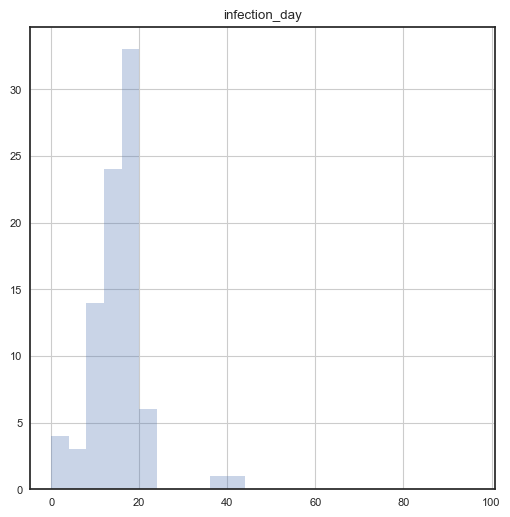

In [378]:
fig, ax = plt.subplots(1,1, figsize=(6,6), sharey=True)
ai_df.hist(['infection_day'],alpha=0.3, ax = ax, bins=np.arange(0,100,4))


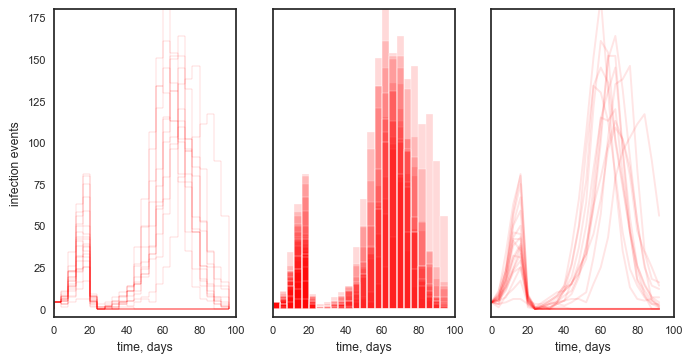

In [381]:
### infection events
##plots
bins = np.arange(0,100,4)

fig, axes = plt.subplots(1,3, figsize=(8,4), sharey=True)
#fig1, ax1 = plt.subplots(1,1, figsize=(6,6), sharey=True)
for l in range(df.shape[1]):
    df.iloc[:,l].hist(ax=axes[0],color='red',alpha=0.4,bins=np.arange(0,100,4),histtype='step',grid=False)
    sns.histplot(df.iloc[:,l], ax=axes[1],color='red',alpha=0.15,bins=np.arange(0,100,4))
    y,x = np.histogram(list(df.iloc[:,l][~pd.isna(df.iloc[:,l])].values), bins=bins)
    axes[2].plot(x[:-1],y, alpha=0.1, color='red')

axes[0].set_ylabel('infection events')
for ax in axes:
    ax.set_xlabel('time, days')
    ax.set_xlim(0,100)
    ax.set_ylim(-5,180)


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Text(14.055555555555559, 0.5, 'attack rate')

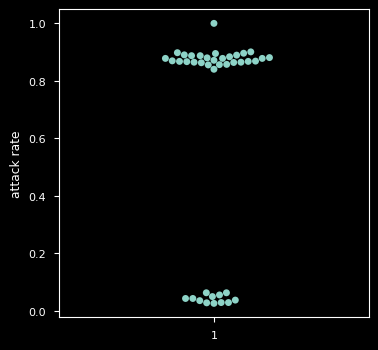

In [21]:
df1 = pd.read_csv('output_server/hd/AR_small_test_n_40_dT_24_dur_2520.csv').T.reset_index(drop=True)
df1.columns=['1']
fig, ax = plt.subplots(1,1,figsize=(4,4))
sns.swarmplot(data=df1, ax=ax)
ax.set_ylabel('attack rate')
